### 0. 데이터셋 다운로드

주차공간 탐지 데이터셋 다운로드

### 1. 클래스 정보 카운팅하기

In [2]:
import os
import shutil
import random
import json

# 경로 설정
root_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot"

#train_root = os.path.join(root_path, "training", sub_path)

subfolders = [folder for folder in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, folder))]

In [3]:
print(root_path)

/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot


### 2. 그래프에 3d좌표 찍기

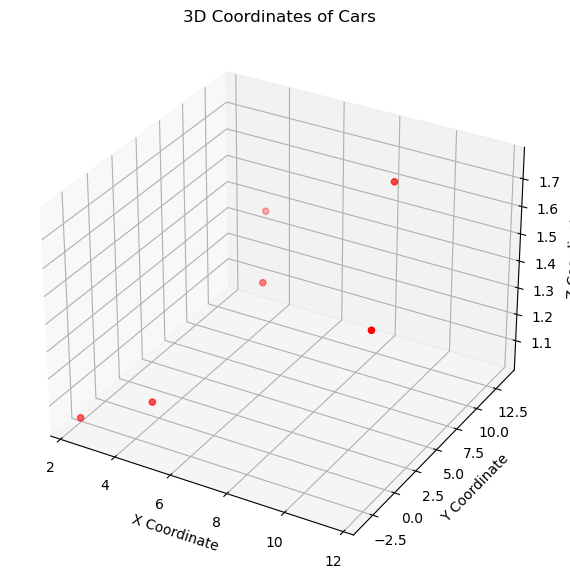

In [28]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import json

# JSON 파일 경로
json_file_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/00000030.json"

# JSON 파일 열기
with open(json_file_path, 'r') as f:
    data = json.load(f)

# bbox3d에서 'Car'의 위치 정보 추출
car_locations = [item['location'] for item in data['bbox3d'] if item['name'] == 'Car']

# 3D 플롯 생성
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# x, y, z 좌표 추출
x = [loc[0] for loc in car_locations]
y = [loc[1] for loc in car_locations]
z = [loc[2] for loc in car_locations]

# 3D 산점도 그래프 그리기
ax.scatter(x, y, z, c='r', marker='o')

# 축 레이블 추가
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')

# 제목 추가
ax.set_title('3D Coordinates of Cars')

# 그래프 표시
plt.show()

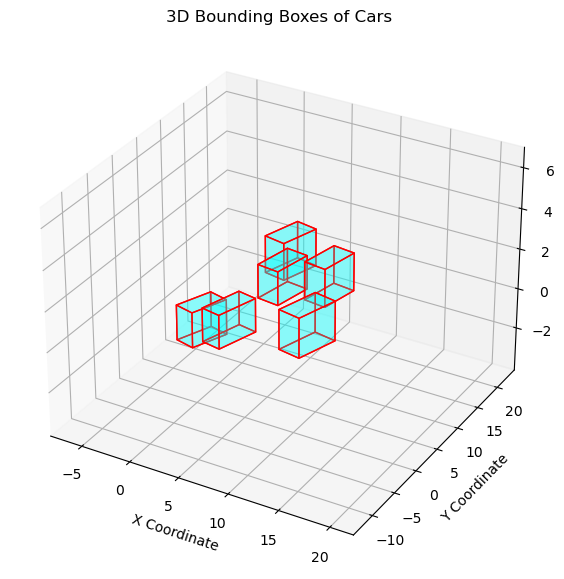

In [30]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import json
import numpy as np

# JSON 파일 경로
json_file_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/00000030.json"

# JSON 파일 열기
with open(json_file_path, 'r') as f:
    data = json.load(f)

# bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

# 3D 플롯 생성
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# 각 Car에 대해 3D 박스를 그리기
for car in car_bbox3d:
    dimensions = car['dimensions']
    location = car['location']
    rotation_z = car['rotation_z']

    # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
    length, width, height = dimensions
    x, y, z = location

    # 박스의 8개 꼭짓점 계산 (회전 없음)
    box_points = np.array([
        [x - length / 2, y - width / 2, z - height / 2],  # 0
        [x + length / 2, y - width / 2, z - height / 2],  # 1
        [x + length / 2, y + width / 2, z - height / 2],  # 2
        [x - length / 2, y + width / 2, z - height / 2],  # 3
        [x - length / 2, y - width / 2, z + height / 2],  # 4
        [x + length / 2, y - width / 2, z + height / 2],  # 5
        [x + length / 2, y + width / 2, z + height / 2],  # 6
        [x - length / 2, y + width / 2, z + height / 2],  # 7
    ])

    # 회전 적용 (Z축 회전)
    cos_theta = np.cos(rotation_z)
    sin_theta = np.sin(rotation_z)
    rotation_matrix = np.array([
        [cos_theta, -sin_theta, 0],
        [sin_theta, cos_theta, 0],
        [0, 0, 1]
    ])

    # 각 점에 회전 행렬 적용
    box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

    # 3D 상자 그리기 (면들 정의)
    faces = [
        [box_points_rotated[0], box_points_rotated[1], box_points_rotated[2], box_points_rotated[3]],  # 바닥
        [box_points_rotated[4], box_points_rotated[5], box_points_rotated[6], box_points_rotated[7]],  # 윗면
        [box_points_rotated[0], box_points_rotated[1], box_points_rotated[5], box_points_rotated[4]],  # 앞면
        [box_points_rotated[2], box_points_rotated[3], box_points_rotated[7], box_points_rotated[6]],  # 뒷면
        [box_points_rotated[0], box_points_rotated[3], box_points_rotated[7], box_points_rotated[4]],  # 왼쪽면
        [box_points_rotated[1], box_points_rotated[2], box_points_rotated[6], box_points_rotated[5]]   # 오른쪽면
    ]

    # 면들 그리기
    ax.add_collection3d(Poly3DCollection(faces, facecolors='cyan', linewidths=1, edgecolors='r', alpha=.25))

# 축 레이블 추가
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_zlabel('Z Coordinate')

# 그래프 제목 추가
ax.set_title('3D Bounding Boxes of Cars')

# 축의 범위 설정 (박스의 크기 및 위치를 기준으로)
x_all = [item['location'][0] for item in car_bbox3d]
y_all = [item['location'][1] for item in car_bbox3d]
z_all = [item['location'][2] for item in car_bbox3d]

# 추가로 크기까지 고려하여 범위를 설정 (여유 공간 확보)
ax.set_xlim([min(x_all) - 10, max(x_all) + 10])
ax.set_ylim([min(y_all) - 10, max(y_all) + 10])
ax.set_zlim([min(z_all) - 5, max(z_all) + 5])

# 그래프 표시
plt.show()

pcd 파일 시각화하기

In [47]:
# !pip install pyvista
# !pip install open3d
# !pip install trame

/Users/foto2/anaconda3/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:37: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/foto2/anaconda3/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


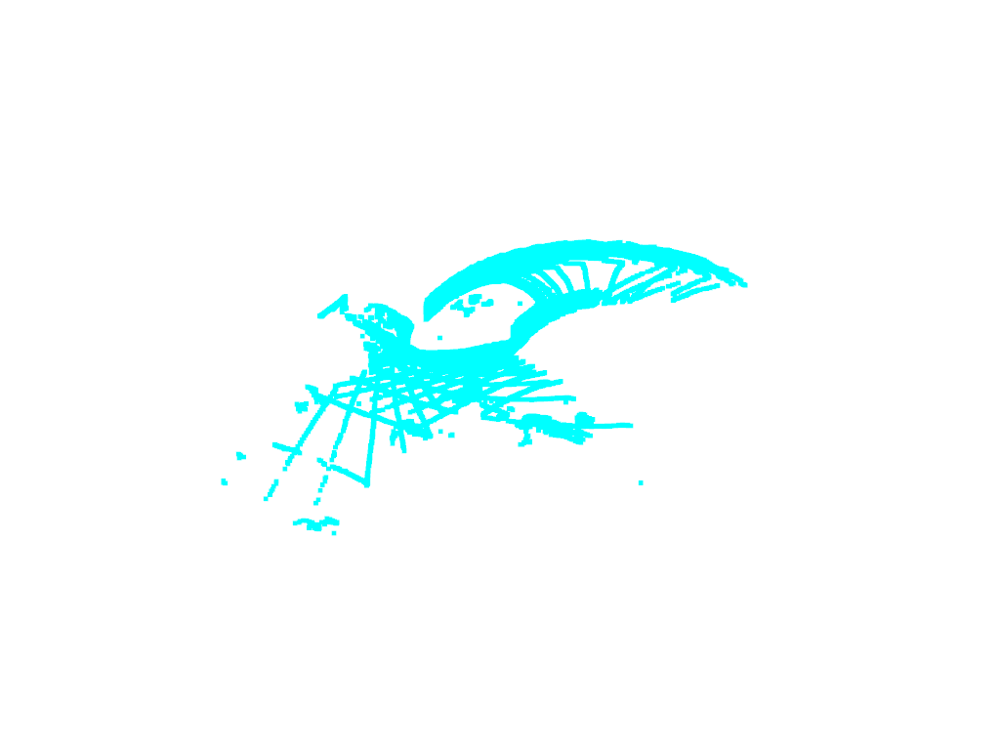

In [48]:
import open3d as o3d
import pyvista as pv
import numpy as np

lidar_path="/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/00000030.pcd"

# PCD 파일 로드
pcd = o3d.io.read_point_cloud(lidar_path)

# 포인트 클라우드 데이터를 numpy 배열로 변환
points = np.asarray(pcd.points)

# PyVista에서 시각화할 수 있는 포인트 클라우드 객체로 변환
point_cloud = pv.PolyData(points)

# PyVista에서 시각화
plotter = pv.Plotter()
plotter.add_points(point_cloud, color='cyan', point_size=5)
plotter.show()

/Users/foto2/anaconda3/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:37: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/foto2/anaconda3/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


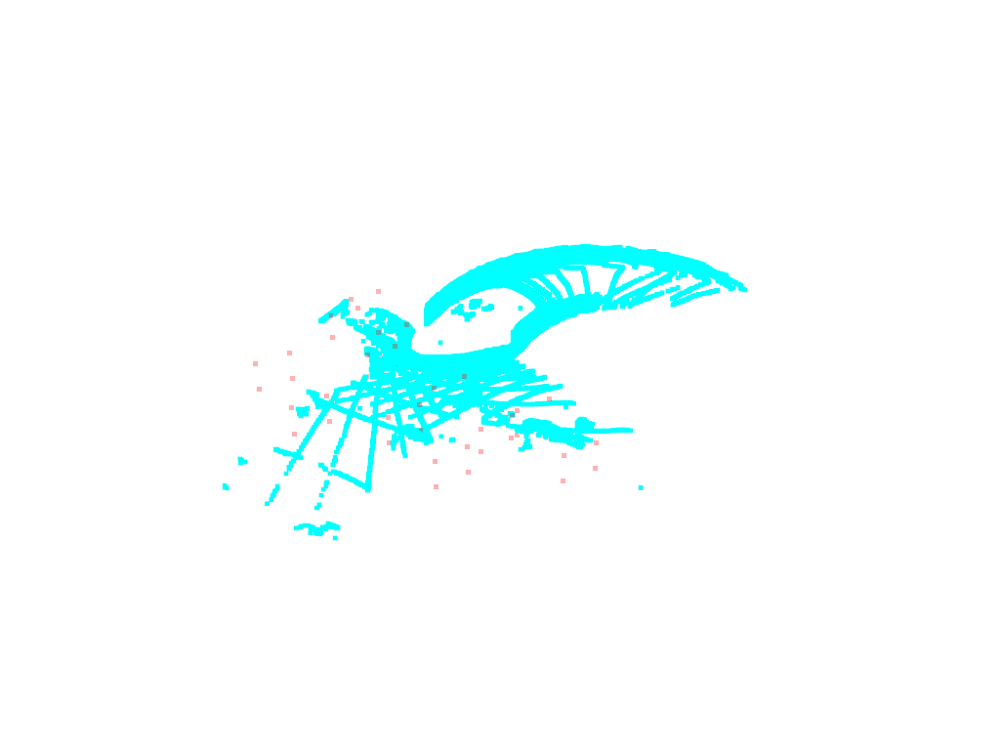

In [51]:
import open3d as o3d
import pyvista as pv
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import json

# LiDAR PCD 파일 경로
lidar_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/00000030.pcd"
# JSON 파일 경로
json_file_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/00000030.json"

# PCD 파일 로드
pcd = o3d.io.read_point_cloud(lidar_path)
points = np.asarray(pcd.points)

# JSON 파일 열기
with open(json_file_path, 'r') as f:
    data = json.load(f)

# bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

# PyVista에서 시각화할 수 있는 포인트 클라우드 객체로 변환
point_cloud = pv.PolyData(points)

# PyVista에서 시각화
plotter = pv.Plotter()

# 포인트 클라우드 시각화
plotter.add_points(point_cloud, color='cyan', point_size=5)

# 각 Car에 대해 3D 바운딩 박스를 그리기
for car in car_bbox3d:
    dimensions = car['dimensions']
    location = car['location']
    rotation_z = car['rotation_z']

    # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
    length, width, height = dimensions
    x, y, z = location

    # 박스의 8개 꼭짓점 계산 (회전 없음)
    box_points = np.array([
        [x - length / 2, y - width / 2, z - height / 2],  # 0
        [x + length / 2, y - width / 2, z - height / 2],  # 1
        [x + length / 2, y + width / 2, z - height / 2],  # 2
        [x - length / 2, y + width / 2, z - height / 2],  # 3
        [x - length / 2, y - width / 2, z + height / 2],  # 4
        [x + length / 2, y - width / 2, z + height / 2],  # 5
        [x + length / 2, y + width / 2, z + height / 2],  # 6
        [x - length / 2, y + width / 2, z + height / 2],  # 7
    ])

    # 회전 적용 (Z축 회전)
    cos_theta = np.cos(rotation_z)
    sin_theta = np.sin(rotation_z)
    rotation_matrix = np.array([
        [cos_theta, -sin_theta, 0],
        [sin_theta, cos_theta, 0],
        [0, 0, 1]
    ])

    # 각 점에 회전 행렬 적용
    box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

    # 3D 상자 그리기 (면들 정의)
    faces = [
        [box_points_rotated[0], box_points_rotated[1], box_points_rotated[2], box_points_rotated[3]],  # 바닥
        [box_points_rotated[4], box_points_rotated[5], box_points_rotated[6], box_points_rotated[7]],  # 윗면
        [box_points_rotated[0], box_points_rotated[1], box_points_rotated[5], box_points_rotated[4]],  # 앞면
        [box_points_rotated[2], box_points_rotated[3], box_points_rotated[7], box_points_rotated[6]],  # 뒷면
        [box_points_rotated[0], box_points_rotated[3], box_points_rotated[7], box_points_rotated[4]],  # 왼쪽면
        [box_points_rotated[1], box_points_rotated[2], box_points_rotated[6], box_points_rotated[5]]   # 오른쪽면
    ]

    # 면들 그리기
    plotter.add_mesh(pv.PolyData(box_points_rotated), color='red', opacity=0.3)

# 시각화
plotter.show()

/Users/foto2/anaconda3/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:37: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/Users/foto2/anaconda3/lib/python3.11/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


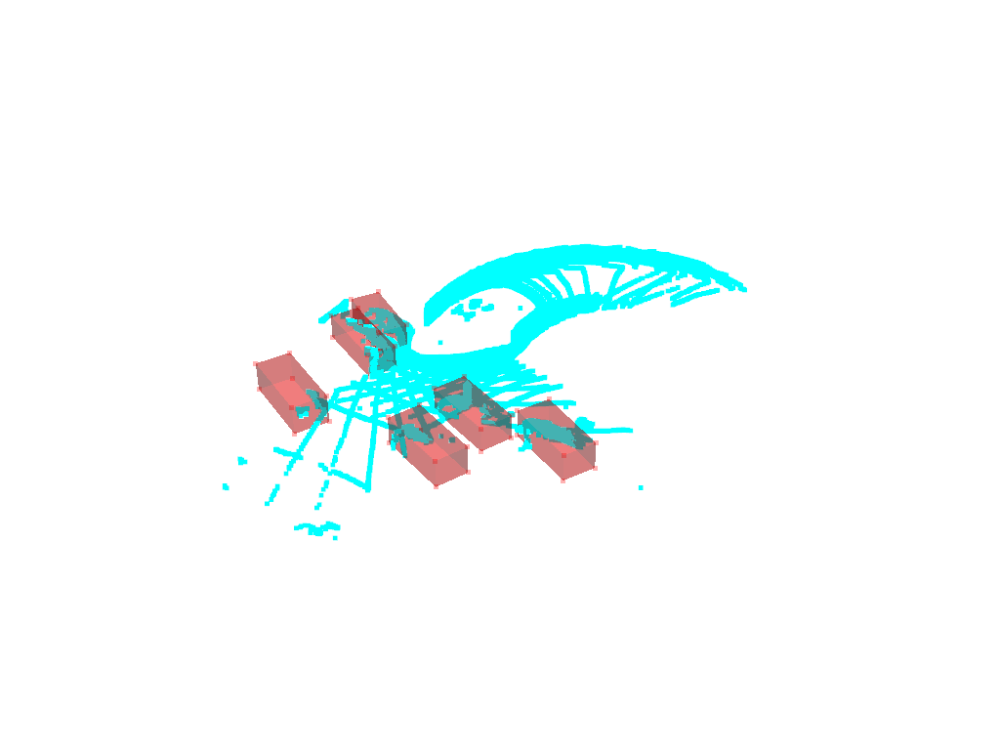

In [53]:
import open3d as o3d
import pyvista as pv
import numpy as np
import json

# LiDAR PCD 파일 경로
lidar_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/00000030.pcd"
# JSON 파일 경로
json_file_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/00000030.json"

# PCD 파일 로드
pcd = o3d.io.read_point_cloud(lidar_path)
points = np.asarray(pcd.points)

# JSON 파일 열기
with open(json_file_path, 'r') as f:
    data = json.load(f)

# bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

# PyVista에서 시각화할 수 있는 포인트 클라우드 객체로 변환
point_cloud = pv.PolyData(points)

# PyVista에서 시각화
plotter = pv.Plotter()

# 포인트 클라우드 시각화
plotter.add_points(point_cloud, color='cyan', point_size=5)

# 각 Car에 대해 3D 바운딩 박스를 그리기
for car in car_bbox3d:
    dimensions = car['dimensions']
    location = car['location']
    rotation_z = car['rotation_z']

    # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
    length, width, height = dimensions
    x, y, z = location

    # 박스의 8개 꼭짓점 계산 (회전 없음)
    box_points = np.array([
        [x - length / 2, y - width / 2, z - height / 2],  # 0
        [x + length / 2, y - width / 2, z - height / 2],  # 1
        [x + length / 2, y + width / 2, z - height / 2],  # 2
        [x - length / 2, y + width / 2, z - height / 2],  # 3
        [x - length / 2, y - width / 2, z + height / 2],  # 4
        [x + length / 2, y - width / 2, z + height / 2],  # 5
        [x + length / 2, y + width / 2, z + height / 2],  # 6
        [x - length / 2, y + width / 2, z + height / 2],  # 7
    ])

    # 회전 적용 (Z축 회전)
    cos_theta = np.cos(rotation_z)
    sin_theta = np.sin(rotation_z)
    rotation_matrix = np.array([
        [cos_theta, -sin_theta, 0],
        [sin_theta, cos_theta, 0],
        [0, 0, 1]
    ])

    # 각 점에 회전 행렬 적용
    box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

    # 3D 상자 그리기 (면들 정의)
    faces = [
        [0, 1, 2, 3],  # 바닥
        [4, 5, 6, 7],  # 윗면
        [0, 1, 5, 4],  # 앞면
        [2, 3, 7, 6],  # 뒷면
        [0, 3, 7, 4],  # 왼쪽면
        [1, 2, 6, 5]   # 오른쪽면
    ]

    # 면들 그리기
    box_faces = np.array(faces)
    
    # PyVista에서 3D 박스 그리기
    box_poly = pv.PolyData(box_points_rotated)
    
    # 각 면을 정의 (4개의 꼭짓점으로 구성)
    box_poly.faces = np.hstack([np.full((box_faces.shape[0], 1), 4), box_faces]).flatten()
    
    # 박스를 시각화에 추가
    plotter.add_mesh(box_poly, color='red', opacity=0.3)

# 시각화
plotter.show()

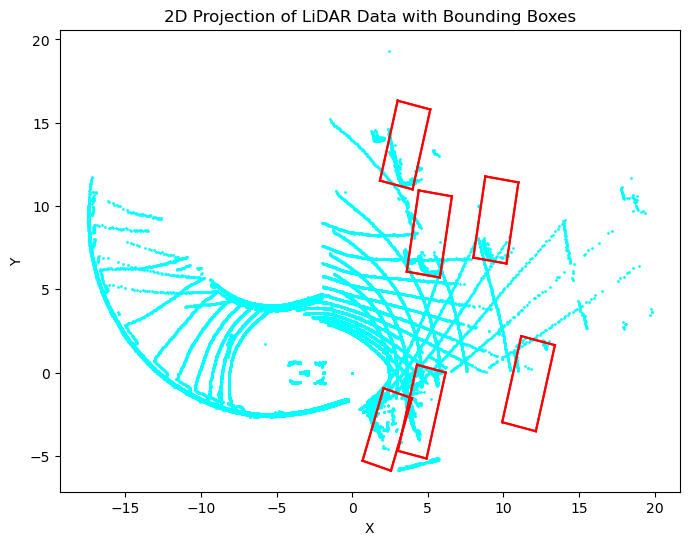

In [54]:
import open3d as o3d
import pyvista as pv
import numpy as np
import json
import matplotlib.pyplot as plt

# LiDAR PCD 파일 경로
lidar_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/00000030.pcd"
# JSON 파일 경로
json_file_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/00000030.json"

# PCD 파일 로드
pcd = o3d.io.read_point_cloud(lidar_path)
points = np.asarray(pcd.points)

# JSON 파일 열기
with open(json_file_path, 'r') as f:
    data = json.load(f)

# bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

# LiDAR 포인트 클라우드를 2D로 투영하여 시각화할 준비
# 투영 행렬 정의 (간단한 직교 투영)
def project_to_2d(points_3d):
    # 간단한 직교 투영 (Z축은 제외)
    points_2d = points_3d[:, :2]
    return points_2d

# 2D 평면에 LiDAR 포인트 클라우드 시각화
projected_points = project_to_2d(points)
plt.figure(figsize=(8, 6))
plt.scatter(projected_points[:, 0], projected_points[:, 1], color='cyan', s=1)

# 각 Car에 대해 3D 바운딩 박스를 2D로 투영하여 그리기
for car in car_bbox3d:
    dimensions = car['dimensions']
    location = car['location']
    rotation_z = car['rotation_z']

    # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
    length, width, height = dimensions
    x, y, z = location

    # 박스의 8개 꼭짓점 계산 (회전 없음)
    box_points = np.array([
        [x - length / 2, y - width / 2, z - height / 2],  # 0
        [x + length / 2, y - width / 2, z - height / 2],  # 1
        [x + length / 2, y + width / 2, z - height / 2],  # 2
        [x - length / 2, y + width / 2, z - height / 2],  # 3
        [x - length / 2, y - width / 2, z + height / 2],  # 4
        [x + length / 2, y - width / 2, z + height / 2],  # 5
        [x + length / 2, y + width / 2, z + height / 2],  # 6
        [x - length / 2, y + width / 2, z + height / 2],  # 7
    ])

    # 회전 적용 (Z축 회전)
    cos_theta = np.cos(rotation_z)
    sin_theta = np.sin(rotation_z)
    rotation_matrix = np.array([
        [cos_theta, -sin_theta, 0],
        [sin_theta, cos_theta, 0],
        [0, 0, 1]
    ])

    # 각 점에 회전 행렬 적용
    box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

    # 2D로 투영
    projected_box_points = project_to_2d(box_points_rotated)

    # 2D 평면에 박스 그리기 (사각형)
    # 각 면을 그리기 위해 점들을 연결
    for i in [0, 1, 2, 3, 4, 5, 6, 7]:
        plt.plot([projected_box_points[i % 4, 0], projected_box_points[(i+1) % 4, 0]], 
                 [projected_box_points[i % 4, 1], projected_box_points[(i+1) % 4, 1]], color='red')

    for i in [0, 4, 1, 5, 2, 6, 3, 7]:
        plt.plot([projected_box_points[i, 0], projected_box_points[(i+4) % 8, 0]], 
                 [projected_box_points[i, 1], projected_box_points[(i+4) % 8, 1]], color='red')

# 그래프 제목과 축 레이블 추가
plt.title('2D Projection of LiDAR Data with Bounding Boxes')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

In [1]:
# import open3d as o3d
# import pyvista as pv
# import numpy as np
# import json
# import os

# # LiDAR PCD 파일 경로
# lidar_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/"
# json_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/"

# # PCD 파일과 JSON 파일 경로를 재귀적으로 탐색하는 함수
# def get_all_files(lidar_base_path, json_base_path):
#     lidar_files = []
#     json_files = []

#     # 모든 하위 폴더를 탐색
#     for root, dirs, files in os.walk(lidar_base_path):
#         for file in files:
#             if file.endswith('.pcd'):
#                 lidar_files.append(os.path.join(root, file))

#     for root, dirs, files in os.walk(json_base_path):
#         for file in files:
#             if file.endswith('.json'):
#                 json_files.append(os.path.join(root, file))

#     return lidar_files, json_files

# # LiDAR와 JSON 파일이 일치하도록 정렬 (파일 이름 기준)
# def match_files(lidar_files, json_files):
#     matched_files = []
    
#     for lidar_file in lidar_files:
#         lidar_file_name = os.path.basename(lidar_file)
#         json_file_name = lidar_file_name.replace('.pcd', '.json')  # PCD 파일명과 JSON 파일명이 같다고 가정
        
#         for json_file in json_files:
#             if os.path.basename(json_file) == json_file_name:
#                 matched_files.append((lidar_file, json_file))
#                 break
#     return matched_files

# # PyVista에서 시각화할 수 있는 포인트 클라우드 객체로 변환하는 함수
# def visualize_point_cloud_with_bboxes(lidar_path, json_file_path):
#     # PCD 파일 로드
#     pcd = o3d.io.read_point_cloud(lidar_path)
#     points = np.asarray(pcd.points)

#     # JSON 파일 열기
#     with open(json_file_path, 'r') as f:
#         data = json.load(f)

#     # bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
#     car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

#     # PyVista에서 시각화할 수 있는 포인트 클라우드 객체로 변환
#     point_cloud = pv.PolyData(points)

#     # PyVista에서 시각화
#     plotter = pv.Plotter()

#     # 포인트 클라우드 시각화
#     plotter.add_points(point_cloud, color='cyan', point_size=5)

#     # 각 Car에 대해 3D 바운딩 박스를 그리기
#     for car in car_bbox3d:
#         dimensions = car['dimensions']
#         location = car['location']
#         rotation_z = car['rotation_z']

#         # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
#         length, width, height = dimensions
#         x, y, z = location

#         # 박스의 8개 꼭짓점 계산 (회전 없음)
#         box_points = np.array([
#             [x - length / 2, y - width / 2, z - height / 2],  # 0
#             [x + length / 2, y - width / 2, z - height / 2],  # 1
#             [x + length / 2, y + width / 2, z - height / 2],  # 2
#             [x - length / 2, y + width / 2, z - height / 2],  # 3
#             [x - length / 2, y - width / 2, z + height / 2],  # 4
#             [x + length / 2, y - width / 2, z + height / 2],  # 5
#             [x + length / 2, y + width / 2, z + height / 2],  # 6
#             [x - length / 2, y + width / 2, z + height / 2],  # 7
#         ])

#         # 회전 적용 (Z축 회전)
#         cos_theta = np.cos(rotation_z)
#         sin_theta = np.sin(rotation_z)
#         rotation_matrix = np.array([
#             [cos_theta, -sin_theta, 0],
#             [sin_theta, cos_theta, 0],
#             [0, 0, 1]
#         ])

#         # 각 점에 회전 행렬 적용
#         box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

#         # 3D 상자 그리기 (면들 정의)
#         faces = [
#             [0, 1, 2, 3],  # 바닥
#             [4, 5, 6, 7],  # 윗면
#             [0, 1, 5, 4],  # 앞면
#             [2, 3, 7, 6],  # 뒷면
#             [0, 3, 7, 4],  # 왼쪽면
#             [1, 2, 6, 5]   # 오른쪽면
#         ]

#         # 면들 그리기
#         box_faces = np.array(faces)
        
#         # PyVista에서 3D 박스 그리기
#         box_poly = pv.PolyData(box_points_rotated)
        
#         # 각 면을 정의 (4개의 꼭짓점으로 구성)
#         box_poly.faces = np.hstack([np.full((box_faces.shape[0], 1), 4), box_faces]).flatten()
        
#         # 박스를 시각화에 추가
#         plotter.add_mesh(box_poly, color='red', opacity=0.3)

#     # 시각화
#     plotter.show()

# # LiDAR와 JSON 파일 얻기
# lidar_files, json_files = get_all_files(lidar_base_path, json_base_path)

# # LiDAR와 JSON 파일이 일치하도록 정렬
# matched_files = match_files(lidar_files, json_files)

# # 각 파일에 대해 시각화 수행
# for lidar_file, json_file in matched_files:
#     visualize_point_cloud_with_bboxes(lidar_file, json_file)

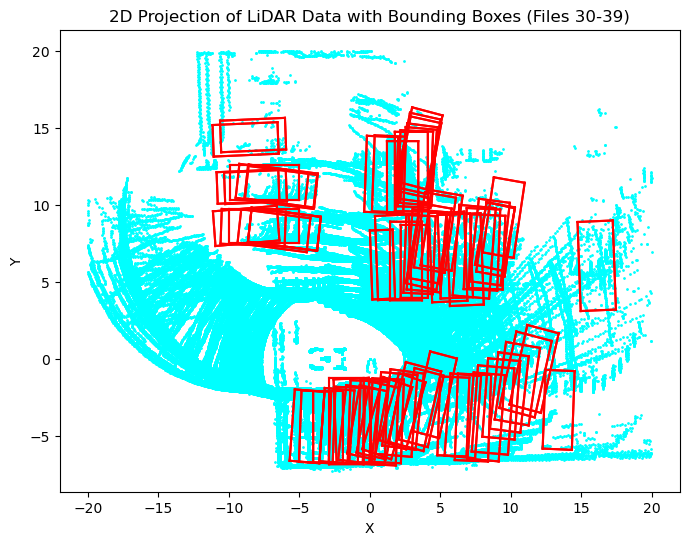

In [55]:
import open3d as o3d
import pyvista as pv
import numpy as np
import json
import matplotlib.pyplot as plt

# 파일 번호 범위 (30 ~ 39)
file_range = range(30, 40)

# LiDAR PCD 파일 경로와 JSON 파일 경로의 기본 경로
lidar_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/"
json_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/"

# 2D 투영 함수
def project_to_2d(points_3d):
    # 간단한 직교 투영 (Z축은 제외)
    points_2d = points_3d[:, :2]
    return points_2d

# 2D 시각화
plt.figure(figsize=(8, 6))

# 파일 번호에 대해 반복
for file_number in file_range:
    # LiDAR PCD 파일 경로
    lidar_path = f"{lidar_base_path}/{file_number:08d}.pcd"
    # JSON 파일 경로
    json_file_path = f"{json_base_path}/{file_number:08d}.json"

    # PCD 파일 로드
    pcd = o3d.io.read_point_cloud(lidar_path)
    points = np.asarray(pcd.points)

    # JSON 파일 열기
    with open(json_file_path, 'r') as f:
        data = json.load(f)

    # bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
    car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

    # LiDAR 포인트 클라우드를 2D로 투영하여 시각화
    projected_points = project_to_2d(points)
    plt.scatter(projected_points[:, 0], projected_points[:, 1], color='cyan', s=1)

    # 각 Car에 대해 3D 바운딩 박스를 2D로 투영하여 그리기
    for car in car_bbox3d:
        dimensions = car['dimensions']
        location = car['location']
        rotation_z = car['rotation_z']

        # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
        length, width, height = dimensions
        x, y, z = location

        # 박스의 8개 꼭짓점 계산 (회전 없음)
        box_points = np.array([
            [x - length / 2, y - width / 2, z - height / 2],  # 0
            [x + length / 2, y - width / 2, z - height / 2],  # 1
            [x + length / 2, y + width / 2, z - height / 2],  # 2
            [x - length / 2, y + width / 2, z - height / 2],  # 3
            [x - length / 2, y - width / 2, z + height / 2],  # 4
            [x + length / 2, y - width / 2, z + height / 2],  # 5
            [x + length / 2, y + width / 2, z + height / 2],  # 6
            [x - length / 2, y + width / 2, z + height / 2],  # 7
        ])

        # 회전 적용 (Z축 회전)
        cos_theta = np.cos(rotation_z)
        sin_theta = np.sin(rotation_z)
        rotation_matrix = np.array([
            [cos_theta, -sin_theta, 0],
            [sin_theta, cos_theta, 0],
            [0, 0, 1]
        ])

        # 각 점에 회전 행렬 적용
        box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

        # 2D로 투영
        projected_box_points = project_to_2d(box_points_rotated)

        # 2D 평면에 박스 그리기 (사각형)
        # 각 면을 그리기 위해 점들을 연결
        for i in [0, 1, 2, 3, 4, 5, 6, 7]:
            plt.plot([projected_box_points[i % 4, 0], projected_box_points[(i+1) % 4, 0]], 
                     [projected_box_points[i % 4, 1], projected_box_points[(i+1) % 4, 1]], color='red')

        for i in [0, 4, 1, 5, 2, 6, 3, 7]:
            plt.plot([projected_box_points[i, 0], projected_box_points[(i+4) % 8, 0]], 
                     [projected_box_points[i, 1], projected_box_points[(i+4) % 8, 1]], color='red')

# 그래프 제목과 축 레이블 추가
plt.title('2D Projection of LiDAR Data with Bounding Boxes (Files 30-39)')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

In [2]:
# import open3d as o3d
# import pyvista as pv
# import numpy as np
# import json
# import matplotlib.pyplot as plt
# import os

# # LiDAR PCD 파일 경로와 JSON 파일 경로의 기본 경로
# lidar_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/"
# json_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/"

# # 2D 투영 함수
# def project_to_2d(points_3d):
#     # 간단한 직교 투영 (Z축은 제외)
#     points_2d = points_3d[:, :2]
#     return points_2d

# # LiDAR 폴더에 있는 모든 파일 리스트 얻기
# lidar_files = sorted(os.listdir(lidar_base_path))

# # JSON 파일 리스트 얻기
# json_files = sorted(os.listdir(json_base_path))
# ㅌ
# # 2D 시각화
# for lidar_file, json_file in zip(lidar_files, json_files):
#     # LiDAR PCD 파일 경로
#     lidar_path = os.path.join(lidar_base_path, lidar_file)
#     # JSON 파일 경로
#     json_file_path = os.path.join(json_base_path, json_file)

#     # PCD 파일 로드
#     pcd = o3d.io.read_point_cloud(lidar_path)
#     points = np.asarray(pcd.points)

#     # JSON 파일 열기
#     with open(json_file_path, 'r') as f:
#         data = json.load(f)

#     # bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
#     car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

#     # LiDAR 포인트 클라우드를 2D로 투영하여 시각화
#     projected_points = project_to_2d(points)

#     # 새로운 figure 생성 (각 파일마다 개별적으로 시각화)
#     plt.figure(figsize=(8, 6))
#     plt.scatter(projected_points[:, 0], projected_points[:, 1], color='cyan', s=1)

#     # 각 Car에 대해 3D 바운딩 박스를 2D로 투영하여 그리기
#     for car in car_bbox3d:
#         dimensions = car['dimensions']
#         location = car['location']
#         rotation_z = car['rotation_z']

#         # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
#         length, width, height = dimensions
#         x, y, z = location

#         # 박스의 8개 꼭짓점 계산 (회전 없음)
#         box_points = np.array([
#             [x - length / 2, y - width / 2, z - height / 2],  # 0
#             [x + length / 2, y - width / 2, z - height / 2],  # 1
#             [x + length / 2, y + width / 2, z - height / 2],  # 2
#             [x - length / 2, y + width / 2, z - height / 2],  # 3
#             [x - length / 2, y - width / 2, z + height / 2],  # 4
#             [x + length / 2, y - width / 2, z + height / 2],  # 5
#             [x + length / 2, y + width / 2, z + height / 2],  # 6
#             [x - length / 2, y + width / 2, z + height / 2],  # 7
#         ])

#         # 회전 적용 (Z축 회전)
#         cos_theta = np.cos(rotation_z)
#         sin_theta = np.sin(rotation_z)
#         rotation_matrix = np.array([
#             [cos_theta, -sin_theta, 0],
#             [sin_theta, cos_theta, 0],
#             [0, 0, 1]
#         ])

#         # 각 점에 회전 행렬 적용
#         box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

#         # 2D로 투영
#         projected_box_points = project_to_2d(box_points_rotated)

#         # 2D 평면에 박스 그리기 (사각형)
#         # 각 면을 그리기 위해 점들을 연결
#         for i in [0, 1, 2, 3, 4, 5, 6, 7]:
#             plt.plot([projected_box_points[i % 4, 0], projected_box_points[(i+1) % 4, 0]], 
#                      [projected_box_points[i % 4, 1], projected_box_points[(i+1) % 4, 1]], color='red')

#         for i in [0, 4, 1, 5, 2, 6, 3, 7]:
#             plt.plot([projected_box_points[i, 0], projected_box_points[(i+4) % 8, 0]], 
#                      [projected_box_points[i, 1], projected_box_points[(i+4) % 8, 1]], color='red')

#     # 각 LiDAR 파일에 대해 시각화
#     plt.title(f'2D Projection of LiDAR Data with Bounding Boxes ({lidar_file})')
#     plt.xlabel('X')
#     plt.ylabel('Y')
#     plt.show()

- 영상으로 뽑아볼까?

In [ ]:
# pip install imageio-ffmpeg

In [5]:
import open3d as o3d
import pyvista as pv
import numpy as np
import json
import os

# LiDAR PCD 파일 경로
lidar_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/"
json_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/"

# PCD 파일과 JSON 파일 경로를 재귀적으로 탐색하는 함수
def get_all_files(lidar_base_path, json_base_path):
    lidar_files = []
    json_files = []

    # 모든 하위 폴더를 탐색
    for root, dirs, files in os.walk(lidar_base_path):
        for file in files:
            if file.endswith('.pcd'):
                lidar_files.append(os.path.join(root, file))

    for root, dirs, files in os.walk(json_base_path):
        for file in files:
            if file.endswith('.json'):
                json_files.append(os.path.join(root, file))

    return lidar_files, json_files

# LiDAR와 JSON 파일이 일치하도록 정렬 (파일 이름 기준)
def match_files(lidar_files, json_files):
    matched_files = []
    
    for lidar_file in lidar_files:
        lidar_file_name = os.path.basename(lidar_file)
        json_file_name = lidar_file_name.replace('.pcd', '.json')  # PCD 파일명과 JSON 파일명이 같다고 가정
        
        for json_file in json_files:
            if os.path.basename(json_file) == json_file_name:
                matched_files.append((lidar_file, json_file))
                break
    return matched_files

# PyVista에서 시각화할 수 있는 포인트 클라우드 객체로 변환하는 함수
def visualize_point_cloud_with_bboxes(lidar_path, json_file_path, plotter):
    # PCD 파일 로드
    pcd = o3d.io.read_point_cloud(lidar_path)
    points = np.asarray(pcd.points)

    # JSON 파일 열기
    with open(json_file_path, 'r') as f:
        data = json.load(f)

    # bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
    car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

    # PyVista에서 시각화할 수 있는 포인트 클라우드 객체로 변환
    point_cloud = pv.PolyData(points)

    # 포인트 클라우드 시각화
    plotter.add_points(point_cloud, color='cyan', point_size=5)

    # 각 Car에 대해 3D 바운딩 박스를 그리기
    for car in car_bbox3d:
        dimensions = car['dimensions']
        location = car['location']
        rotation_z = car['rotation_z']

        # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
        length, width, height = dimensions
        x, y, z = location

        # 박스의 8개 꼭짓점 계산 (회전 없음)
        box_points = np.array([
            [x - length / 2, y - width / 2, z - height / 2],  # 0
            [x + length / 2, y - width / 2, z - height / 2],  # 1
            [x + length / 2, y + width / 2, z - height / 2],  # 2
            [x - length / 2, y + width / 2, z - height / 2],  # 3
            [x - length / 2, y - width / 2, z + height / 2],  # 4
            [x + length / 2, y - width / 2, z + height / 2],  # 5
            [x + length / 2, y + width / 2, z + height / 2],  # 6
            [x - length / 2, y + width / 2, z + height / 2],  # 7
        ])

        # 회전 적용 (Z축 회전)
        cos_theta = np.cos(rotation_z)
        sin_theta = np.sin(rotation_z)
        rotation_matrix = np.array([
            [cos_theta, -sin_theta, 0],
            [sin_theta, cos_theta, 0],
            [0, 0, 1]
        ])

        # 각 점에 회전 행렬 적용
        box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

        # 3D 상자 그리기 (면들 정의)
        faces = [
            [0, 1, 2, 3],  # 바닥
            [4, 5, 6, 7],  # 윗면
            [0, 1, 5, 4],  # 앞면
            [2, 3, 7, 6],  # 뒷면
            [0, 3, 7, 4],  # 왼쪽면
            [1, 2, 6, 5]   # 오른쪽면
        ]

        # 면들 그리기
        box_faces = np.array(faces)
        
        # PyVista에서 3D 박스 그리기
        box_poly = pv.PolyData(box_points_rotated)
        
        # 각 면을 정의 (4개의 꼭짓점으로 구성)
        box_poly.faces = np.hstack([np.full((box_faces.shape[0], 1), 4), box_faces]).flatten()
        
        # 박스를 시각화에 추가
        plotter.add_mesh(box_poly, color='red', opacity=0.3)

    # 화면 캡처 (프레임 저장)
    plotter.write_frame()

# LiDAR와 JSON 파일 얻기
lidar_files, json_files = get_all_files(lidar_base_path, json_base_path)

# LiDAR와 JSON 파일이 일치하도록 정렬
matched_files = match_files(lidar_files, json_files)[:100]

# PyVista에서 동영상을 생성할 Plotter 객체
plotter = pv.Plotter(off_screen=True, window_size=[800, 600])

# FPS 설정을 명시적으로 지정하여 동영상 생성
plotter.open_movie('output_video.mp4', framerate=24)  # 원하는 FPS로 설정 (예: 24)

# 각 파일에 대해 시각화 및 동영상 프레임 저장
for lidar_file, json_file in matched_files:
    visualize_point_cloud_with_bboxes(lidar_file, json_file, plotter)

# 동영상 저장 종료
plotter.close()

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (800, 600) to (800, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


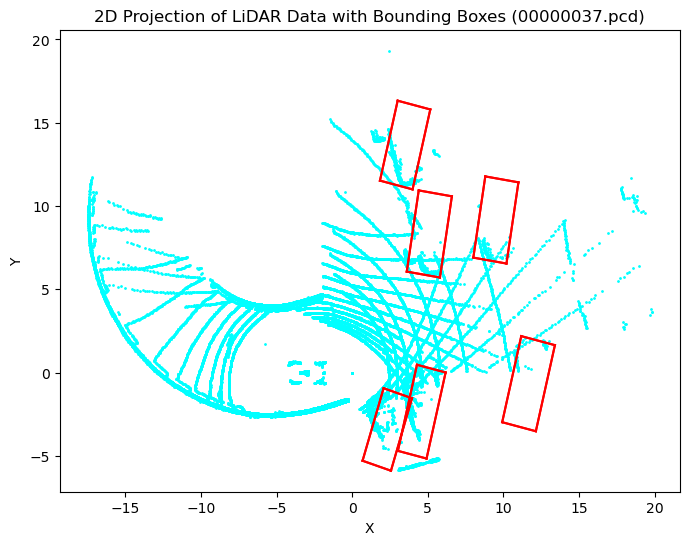

In [7]:
import open3d as o3d
import numpy as np
import json
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import os

# LiDAR PCD 파일 경로와 JSON 파일 경로의 기본 경로
lidar_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/source_data/indoor/mspklot/mspklot370/LiDAR/"
json_base_path = "/Users/foto2/jupyter_notebook/likelion_CV/parkingspace_seg/data/training/label_data/indoor/mspklot/mspklot370/label/"

# 2D 투영 함수
def project_to_2d(points_3d):
    # 간단한 직교 투영 (Z축은 제외)
    points_2d = points_3d[:, :2]
    return points_2d

# LiDAR 폴더에 있는 모든 파일 리스트 얻기
lidar_files = sorted(os.listdir(lidar_base_path))[:100]  # 첫 100개 파일만 사용

# JSON 파일 리스트 얻기
json_files = sorted(os.listdir(json_base_path))[:100]  # 첫 100개 파일만 사용

# 애니메이션을 위한 fig, ax 설정
fig, ax = plt.subplots(figsize=(8, 6))

# 2D 시각화 함수 (애니메이션에서 사용)
def animate(i):
    ax.clear()  # 이전 프레임을 지운 후 새로운 프레임을 그림

    # LiDAR PCD 파일 경로
    lidar_path = os.path.join(lidar_base_path, lidar_files[i])
    # JSON 파일 경로
    json_file_path = os.path.join(json_base_path, json_files[i])

    # PCD 파일 로드
    pcd = o3d.io.read_point_cloud(lidar_path)
    points = np.asarray(pcd.points)

    # JSON 파일 열기
    with open(json_file_path, 'r') as f:
        data = json.load(f)

    # bbox3d에서 'Car'의 위치 정보와 크기 정보 추출
    car_bbox3d = [item for item in data['bbox3d'] if item['name'] == 'Car']

    # LiDAR 포인트 클라우드를 2D로 투영하여 시각화
    projected_points = project_to_2d(points)
    ax.scatter(projected_points[:, 0], projected_points[:, 1], color='cyan', s=1)

    # 각 Car에 대해 3D 바운딩 박스를 2D로 투영하여 그리기
    for car in car_bbox3d:
        dimensions = car['dimensions']
        location = car['location']
        rotation_z = car['rotation_z']

        # 박스를 그릴 8개의 꼭짓점 좌표 계산 (원점 기준으로)
        length, width, height = dimensions
        x, y, z = location

        # 박스의 8개 꼭짓점 계산 (회전 없음)
        box_points = np.array([
            [x - length / 2, y - width / 2, z - height / 2],  # 0
            [x + length / 2, y - width / 2, z - height / 2],  # 1
            [x + length / 2, y + width / 2, z - height / 2],  # 2
            [x - length / 2, y + width / 2, z - height / 2],  # 3
            [x - length / 2, y - width / 2, z + height / 2],  # 4
            [x + length / 2, y - width / 2, z + height / 2],  # 5
            [x + length / 2, y + width / 2, z + height / 2],  # 6
            [x - length / 2, y + width / 2, z + height / 2],  # 7
        ])

        # 회전 적용 (Z축 회전)
        cos_theta = np.cos(rotation_z)
        sin_theta = np.sin(rotation_z)
        rotation_matrix = np.array([
            [cos_theta, -sin_theta, 0],
            [sin_theta, cos_theta, 0],
            [0, 0, 1]
        ])

        # 각 점에 회전 행렬 적용
        box_points_rotated = np.dot(box_points - [x, y, z], rotation_matrix) + [x, y, z]

        # 2D로 투영
        projected_box_points = project_to_2d(box_points_rotated)

        # 2D 평면에 박스 그리기 (사각형)
        for i in [0, 1, 2, 3, 4, 5, 6, 7]:
            ax.plot([projected_box_points[i % 4, 0], projected_box_points[(i+1) % 4, 0]], 
                     [projected_box_points[i % 4, 1], projected_box_points[(i+1) % 4, 1]], color='red')

        for i in [0, 4, 1, 5, 2, 6, 3, 7]:
            ax.plot([projected_box_points[i, 0], projected_box_points[(i+4) % 8, 0]], 
                     [projected_box_points[i, 1], projected_box_points[(i+4) % 8, 1]], color='red')

    # 타이틀과 라벨 설정
    ax.set_title(f'2D Projection of LiDAR Data with Bounding Boxes ({lidar_files[i]})')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')

# 애니메이션 생성
ani = FuncAnimation(fig, animate, frames=len(lidar_files), interval=300, repeat=False)

# Jupyter Notebook에서 애니메이션 보기
from IPython.display import HTML
HTML(ani.to_jshtml())